Tryng to do fluid flow animation followed the code from:

https://medium.com/@zakariatemouch/exploring-fluid-dynamics-using-python-a-numerical-approach-with-navier-stokes-equations-0a00ddae6822

https://www.youtube.com/watch?v=wbYe58NGJJI

Basically it solves incompressible navier stokes equation, by breaking down into certain vector calc steps (you know more than me)


In [34]:
import numpy as np
import matplotlib as plt
import scipy.sparse.linalg as splinalg
from scipy import interpolate

import cmasher
import tqdm

DOMAIN_SIZE = 1.0
N_POINTS = 41
N_TIME_STEPS = 100
TIME_STEP_LENGTH = 0.1
MAX_VISCOSITY = 0.0001
MAX_ITER_CG = None

def forcing_function(time, point):
    time_decay = np.maximum(2.0-0.5*time,
                           0.0,)
    forced_value = (
        time_decay
        *
        np.where(
            (
                (point[0]>0.4)
                &
                (point[0]<0.6)
                &
                (point[1]>0.1)
                &
                (point[1]<0.3)
            ),
            np.array([0.0,1.0]),
            np.array([0.0,0.0]),
        )
    )
    return forced_value

def main():
    element_length = DOMAIN_SIZE / (N_POINTS - 1)
    scalar_shape = (N_POINTS, N_POINTS)
    scalar_dof = N_POINTS**2
    vector_shape = (N_POINTS, N_POINTS, 2)
    vector_dof = N_POINTS**2 * 2
    x = np.linspace(0.0, DOMAIN_SIZE, N_POINTS)
    y = np.linspace(0.0, DOMAIN_SIZE, N_POINTS)
    
    X, Y = np.meshgrid(x,y, indexing="ij")
    #ij index makes differntial operator more logical apparently
    coordinates = np.concatenate(
        (
            X[..., np.newaxis],
            Y[..., np.newaxis],
        ),
        axis=-1,
    )
    
    forcing_function_vectorized = np.vectorized(
        pyfunc=forcing_function,
        signature="(),(d)->(d)",
    )

    def partial_derivative_x(field):
        diff = np.zeros_like(field)
        diff[1:-1, 1:-1]=(
            field[2:, 1:-1]
            -
            field[0:-2, 1:-1]
        )/(
            2 * element_length
        )
        return diff

    def partial_derivative_y(field):
        diff = np.zeros_like(field)
        diff[1:-1, 1:-1]=(
            field[1:-1, 2:]
            -
            field[1:-1, 0:-2]
        )/(
            2 * element_length
        )
        return diff
        

    def laplace(field):
        diff = np.zeros_like(field)
        diff[1:-1,1:-1] = (
            (
                field[0:-2, 1:-1]
                +
                field[1:-1 , 0: -2]
                -
                4
                *
                field[1:-1, 1:-1]
                +
                field[2:, 1:-1]
                +
                field[1:-1, 2:]
            ) / (
                element_length**2
            )
        )
        return diff

    def divergence(vector_field):
        divergence_applied= (
            partail_derivative_x(vector_field[..., 0])
            +
            partial_derivative_y(vector_field[..., 1])
        )
        return divergence_applied

    def gradient(field):
        gradient_applied=np.concatenate(
            (
                partial_derivative_x(field)[..., np.newaxis],
                partial_derivative_y(field)[..., np.newaxis],
            ),
            axis=-1,
        )
        return gradient_applied

    def advect(field, vector_field):
        backtraced_positions = np.clip(
            (
                coordinates
                -
                TIME_STEP_LENGTH
                *
                vector_field
            ),
            0.0,
            DOMAIN_SIZE,
        ),
        advected_field = interpolate.interpn(
            points = (x,y),
            values = field,
            xi = backraced_positions,
        )
        return advected_field

    def diffusion_operator(vector_field_flattened):
        vector_field = vector_field_flattened.reshape(vector_shape)

        diffusion_applied = (
            vector_field
            -
            KINEMATIC_VISCOSITY
            *
            TIME_STEP_LENGTH
            *
            laplace(vector_field)
        )
        return diffusion_applied.flatten()

    def poisson_operator(field_flattened):
        field = field_flattened.reshape(scalar_shape)
        poisson_applied = laplace(field)
        return poisson_applied.flatten()

    plt.style.use("dark background")
    plt.figure(figsize=(5,5), dpi=160)
    
    velocities_prev = np.zeros(vector_shape)
    
    time_current = 0.0
    
    for i in tqdm(range(N_TIME_STEPS)):
        time_current += TIME_STEP_LENGTH
        forces = forcing_function_vectorized(
            time_current,
            coordinates,
        )

        #Apply forces
        velocities_forces_applied = (
            velocities_prev
            +
            TIME_STEP_LENGTH
            *
            forces
        )
        # Non linear convection (self advect)
        
        velocities_advected = advect(
            field=velocities_forces_applied,
            vector_field=velocities_forces_applied,
        )
        #diffusion
        
        velocities_diffused = splinalg.cg(
            A=splinalg.LinearOperator(
                shape=(vector_dof, vector_dof),
                matvec=diffusion_operator,
            ),
            b=velocities_advected.flatten(),
            maxiter=MAX_ITER_CG,
        )[0].rehsape(vector_shape)
        
        #computing vector correction, poisson equation (you know more than me)
        
        pressure=splinalg.cg(
           A=splinalg.LinearOperator(
               shape=(scalar_dof, scalar_dof),
               matvec=poisson_operator,
           ),
            b=divergence(velocities_diffued).flatten(),
            maxiter=MAX_ITER_CG
        )[0].reshape(scalar_shape)
        
        #corrected velocity should be incompressible

        velocities_projected=(
            velocities_diffused
            +
            gradient(pressure)
        )

        #advance to next tiem step
        velocities_prev = velocities_projected
        
        #plot
        plt.quiver(
            X,
            Y,
            velocities_projected[...,0],
            velocities_projected[...,1],
        )
        plt.draw()
        plt.pause(0.0001)
        plt.clf
        
    plt.show()

if __name__ == "__name__":
    main()

  0%|                                                   | 0/100 [00:00<?, ?it/s]

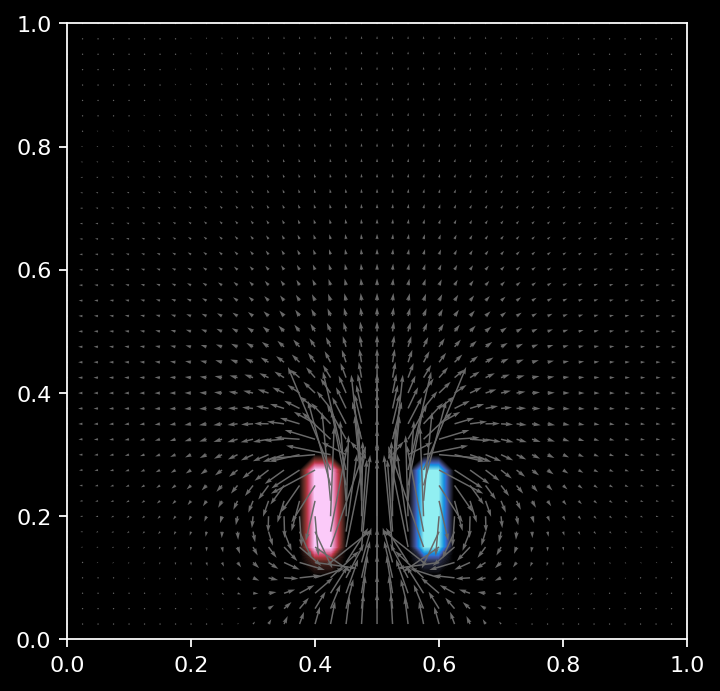

  1%|▍                                          | 1/100 [00:00<00:34,  2.87it/s]

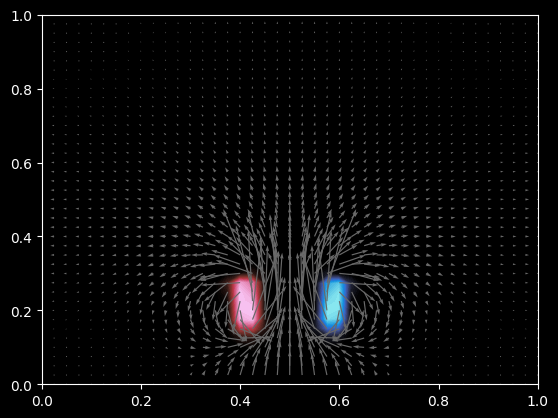

  2%|▊                                          | 2/100 [00:00<00:39,  2.48it/s]

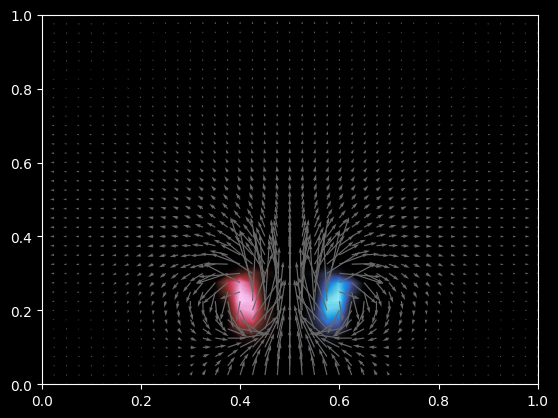

  3%|█▎                                         | 3/100 [00:01<00:35,  2.77it/s]

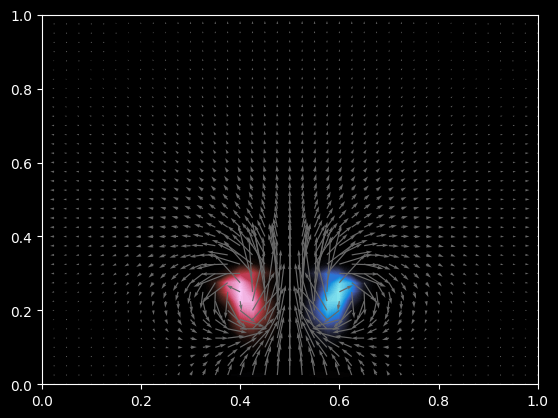

  4%|█▋                                         | 4/100 [00:01<00:35,  2.73it/s]

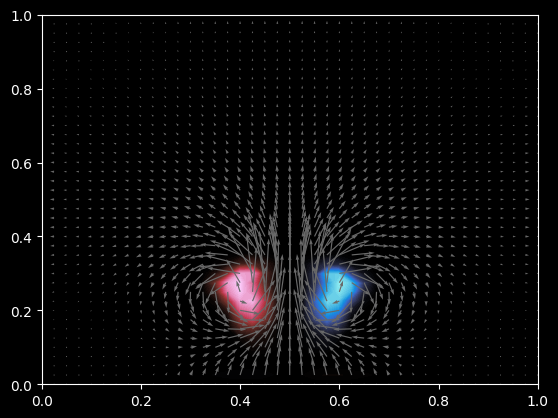

  5%|██▏                                        | 5/100 [00:01<00:35,  2.69it/s]

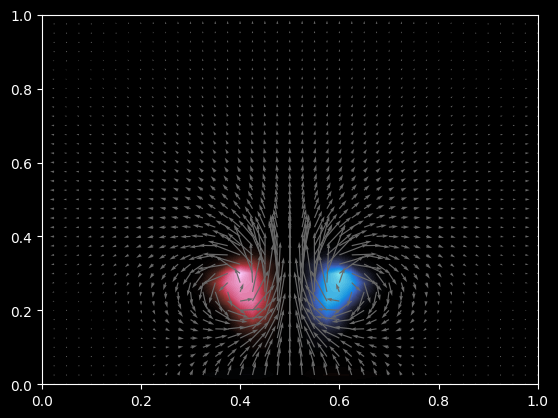

  6%|██▌                                        | 6/100 [00:02<00:34,  2.72it/s]

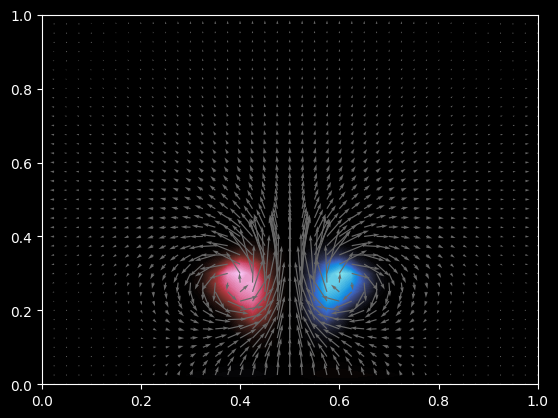

  7%|███                                        | 7/100 [00:02<00:32,  2.85it/s]

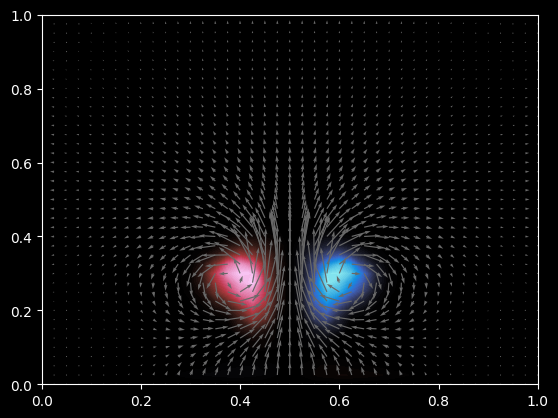

  8%|███▍                                       | 8/100 [00:02<00:31,  2.89it/s]

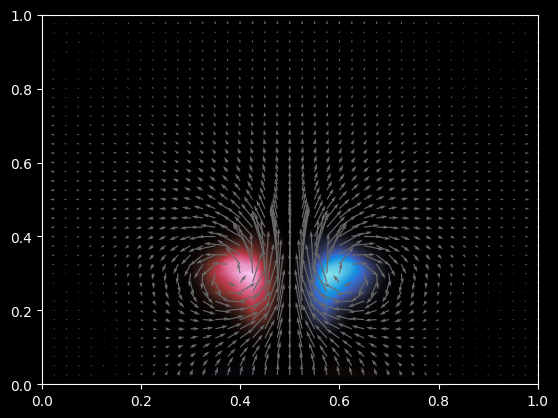

  9%|███▊                                       | 9/100 [00:03<00:31,  2.92it/s]

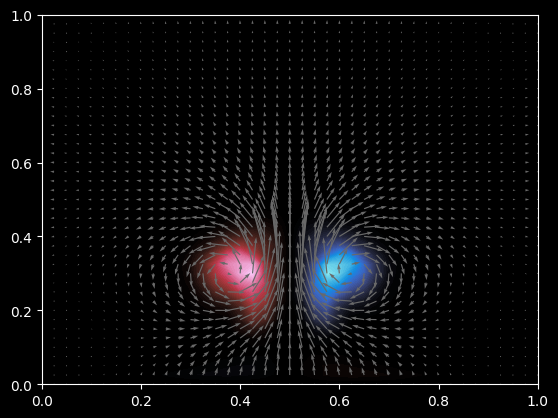

 10%|████▏                                     | 10/100 [00:03<00:31,  2.86it/s]

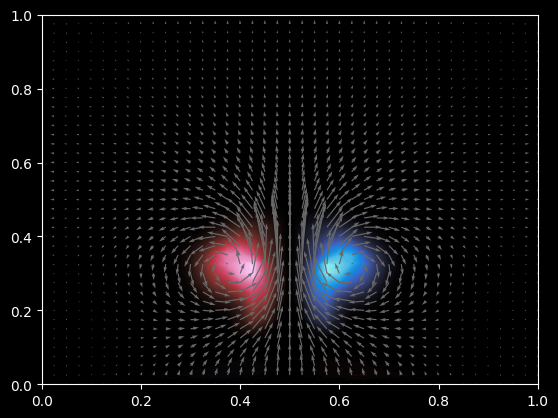

 11%|████▌                                     | 11/100 [00:03<00:30,  2.90it/s]

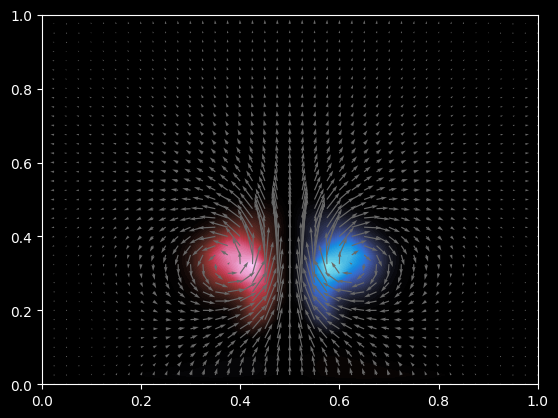

 12%|█████                                     | 12/100 [00:04<00:29,  2.96it/s]

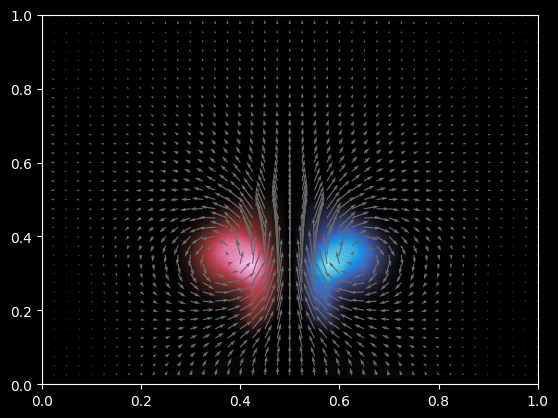

 13%|█████▍                                    | 13/100 [00:04<00:31,  2.74it/s]

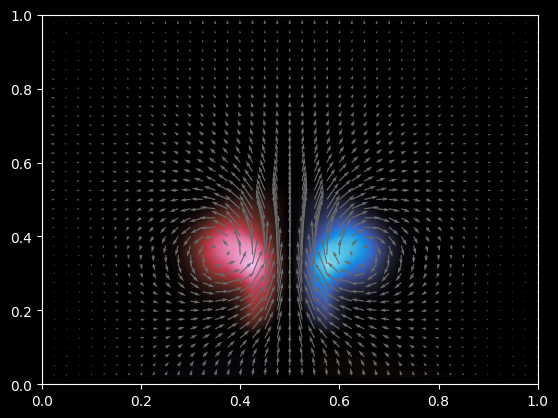

 14%|█████▉                                    | 14/100 [00:04<00:29,  2.89it/s]

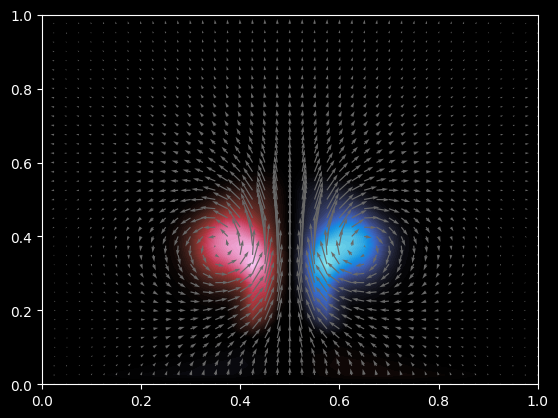

 15%|██████▎                                   | 15/100 [00:05<00:30,  2.83it/s]

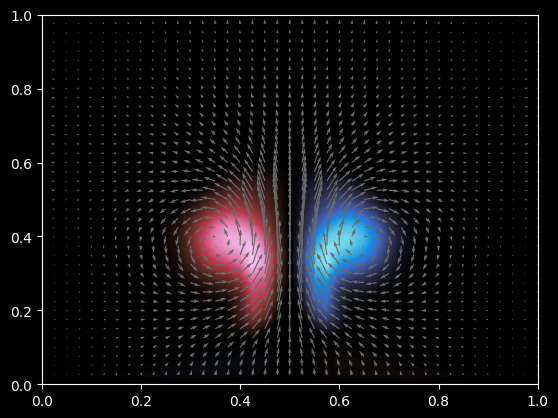

 16%|██████▋                                   | 16/100 [00:05<00:28,  2.95it/s]

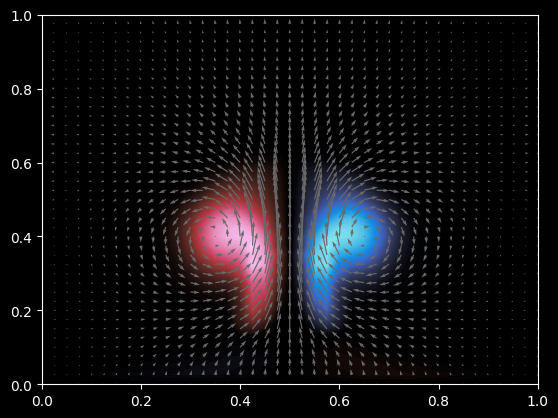

 17%|███████▏                                  | 17/100 [00:05<00:27,  3.03it/s]

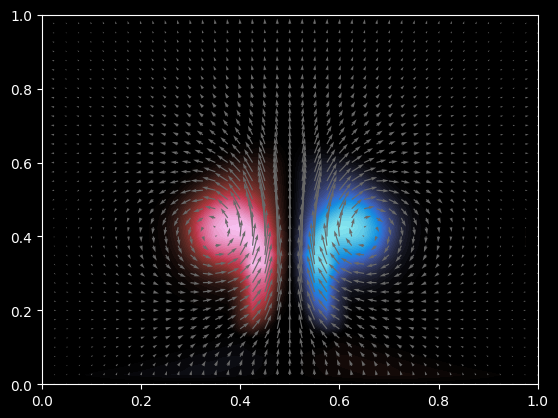

 18%|███████▌                                  | 18/100 [00:06<00:26,  3.09it/s]

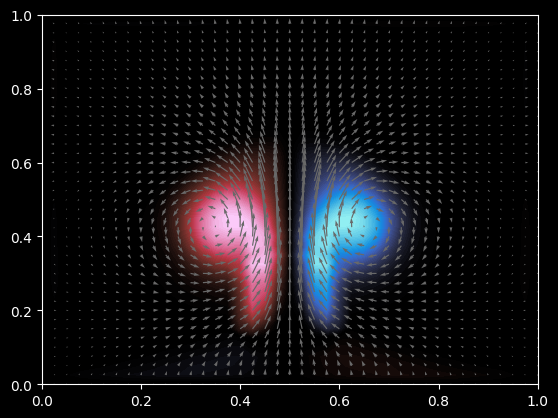

 19%|███████▉                                  | 19/100 [00:06<00:26,  3.11it/s]

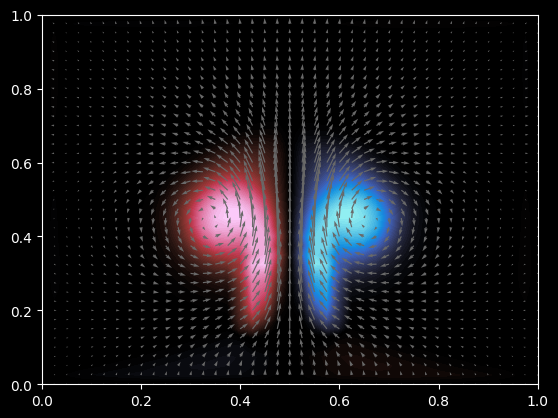

 20%|████████▍                                 | 20/100 [00:06<00:25,  3.10it/s]

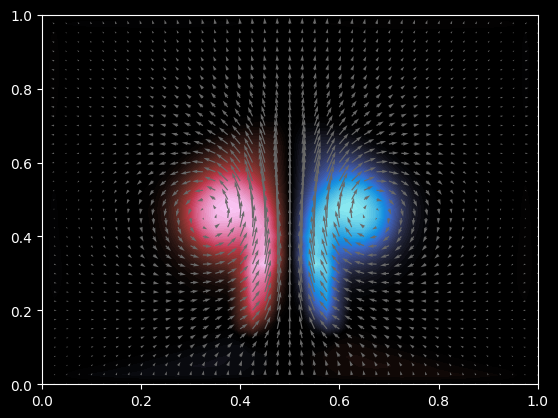

 21%|████████▊                                 | 21/100 [00:07<00:25,  3.12it/s]

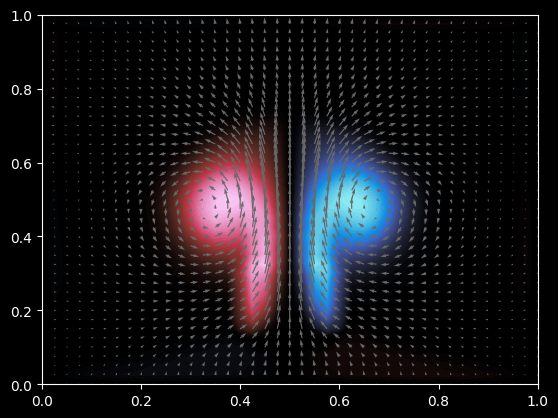

 22%|█████████▏                                | 22/100 [00:07<00:24,  3.16it/s]

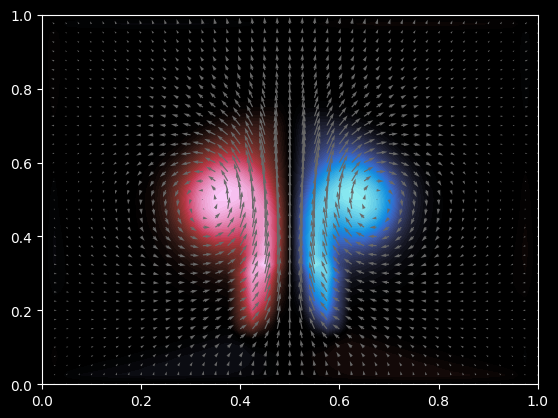

 23%|█████████▋                                | 23/100 [00:07<00:24,  3.16it/s]

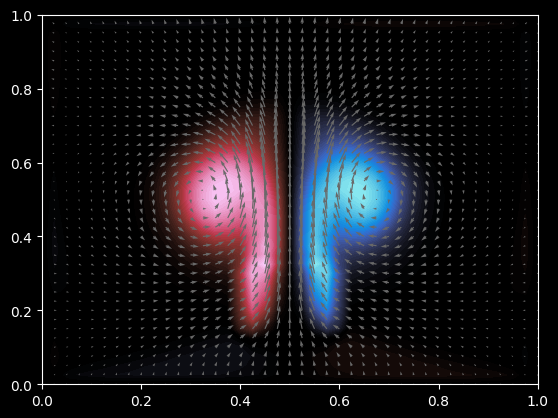

 24%|██████████                                | 24/100 [00:08<00:26,  2.84it/s]

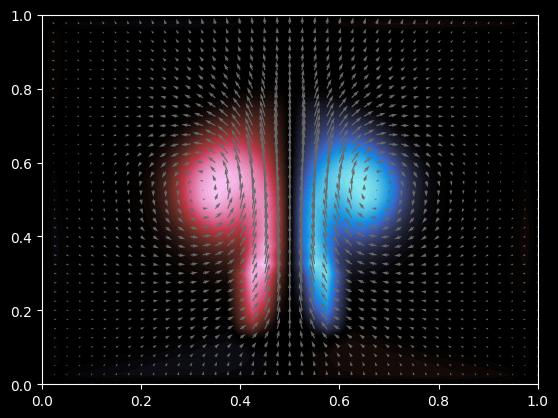

 25%|██████████▌                               | 25/100 [00:08<00:25,  2.92it/s]

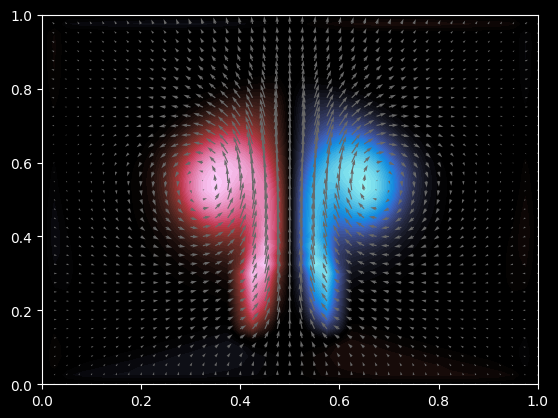

 26%|██████████▉                               | 26/100 [00:08<00:24,  3.01it/s]

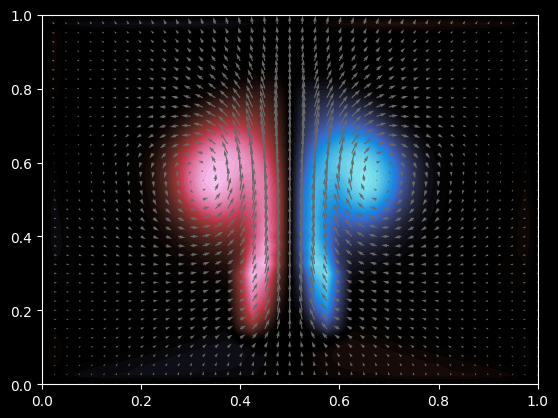

 27%|███████████▎                              | 27/100 [00:09<00:23,  3.08it/s]

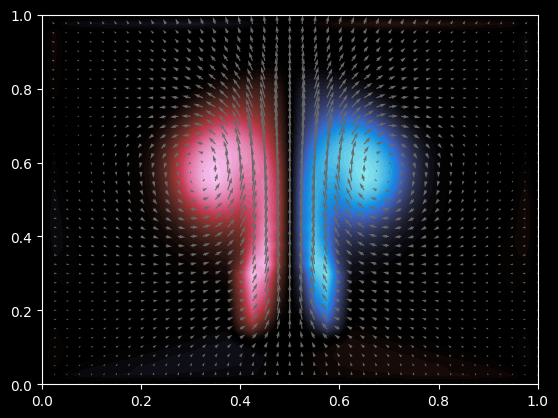

 28%|███████████▊                              | 28/100 [00:09<00:22,  3.13it/s]

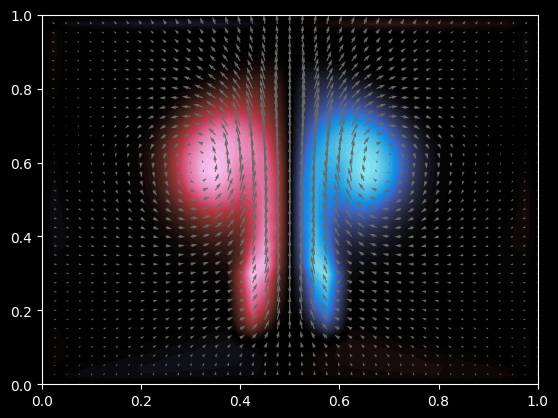

 29%|████████████▏                             | 29/100 [00:09<00:22,  3.18it/s]

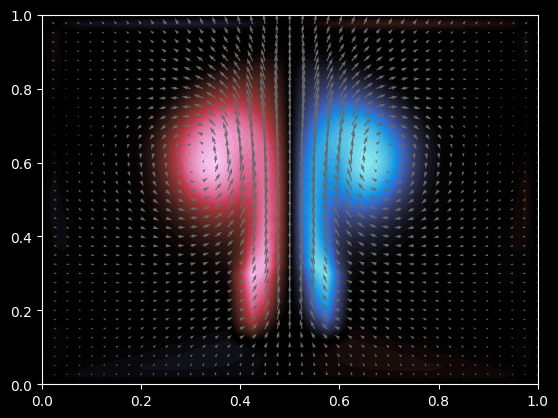

 30%|████████████▌                             | 30/100 [00:10<00:23,  3.00it/s]

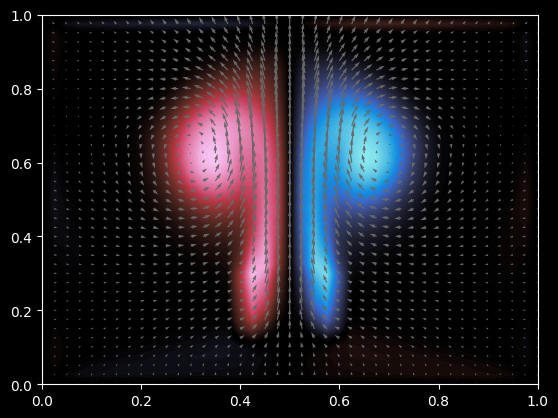

 31%|█████████████                             | 31/100 [00:10<00:22,  3.05it/s]

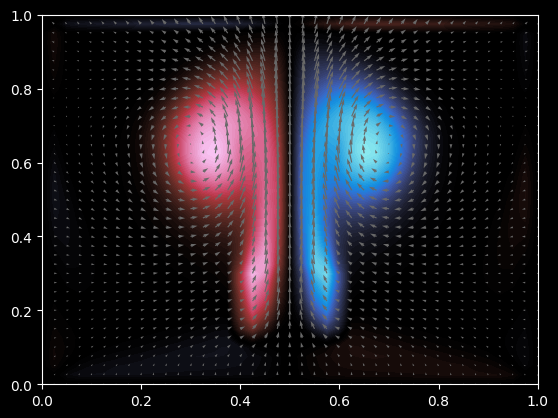

 32%|█████████████▍                            | 32/100 [00:10<00:22,  3.08it/s]

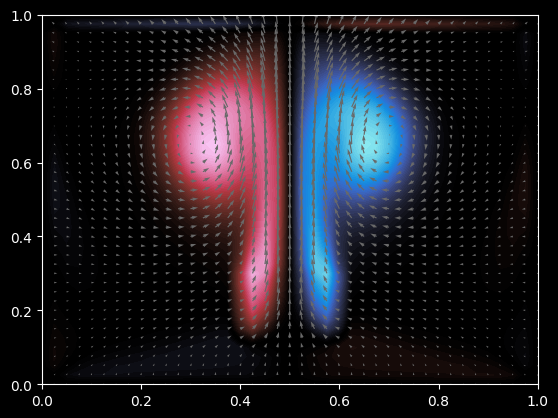

 33%|█████████████▊                            | 33/100 [00:11<00:21,  3.11it/s]

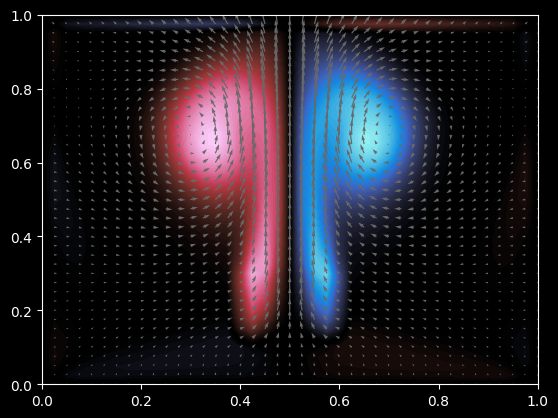

 34%|██████████████▎                           | 34/100 [00:11<00:21,  3.13it/s]

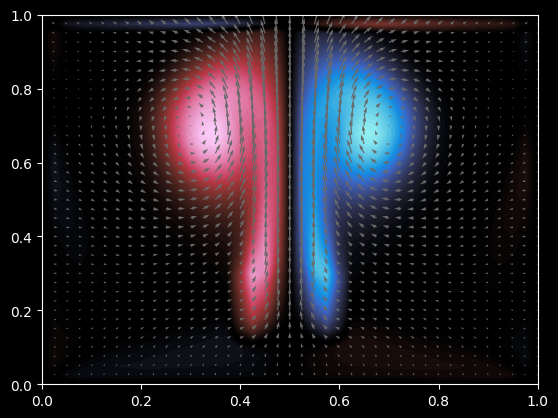

 35%|██████████████▋                           | 35/100 [00:11<00:23,  2.81it/s]

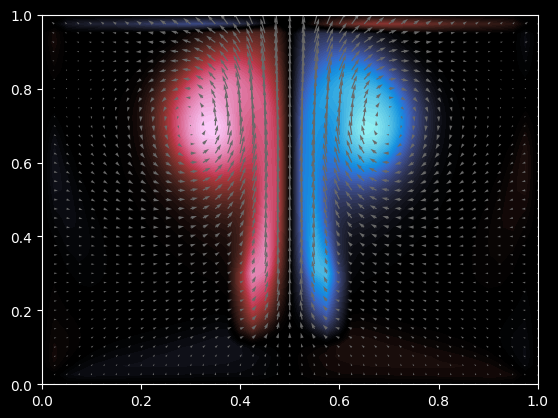

 36%|███████████████                           | 36/100 [00:12<00:22,  2.89it/s]

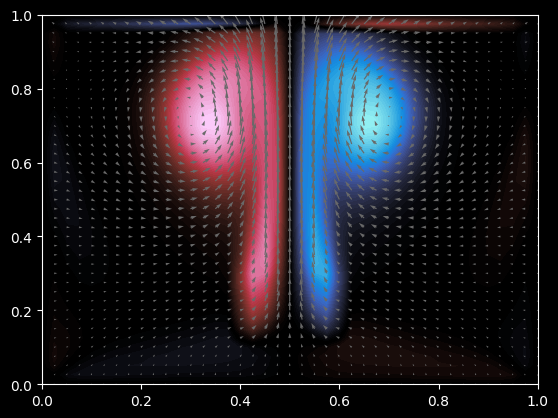

 37%|███████████████▌                          | 37/100 [00:12<00:21,  2.97it/s]

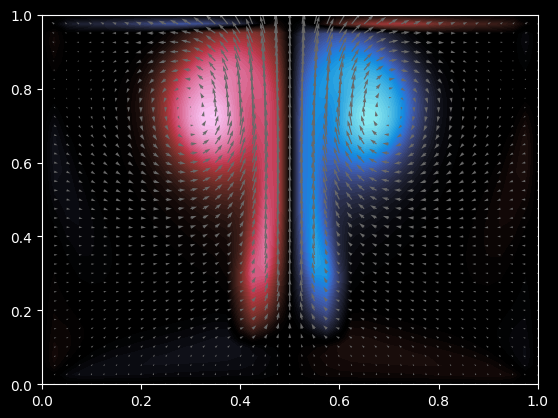

 38%|███████████████▉                          | 38/100 [00:12<00:20,  3.03it/s]

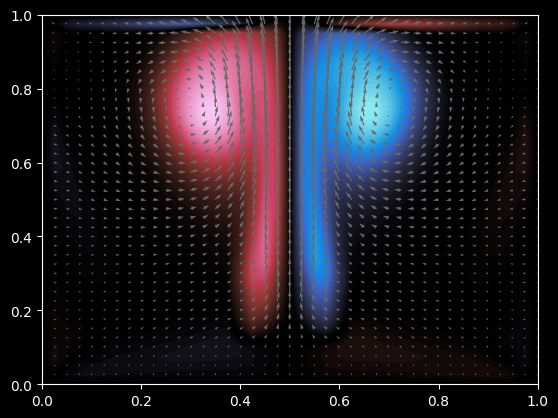

 39%|████████████████▍                         | 39/100 [00:13<00:19,  3.07it/s]

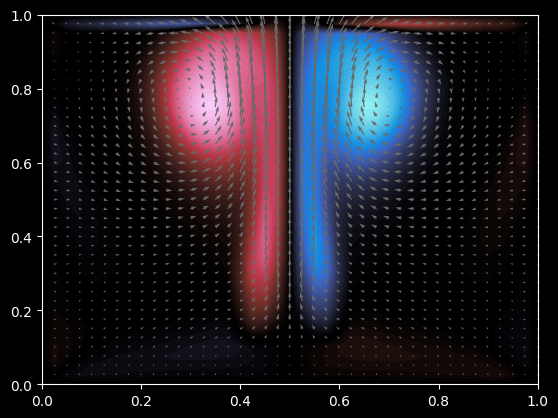

 40%|████████████████▊                         | 40/100 [00:13<00:19,  3.10it/s]

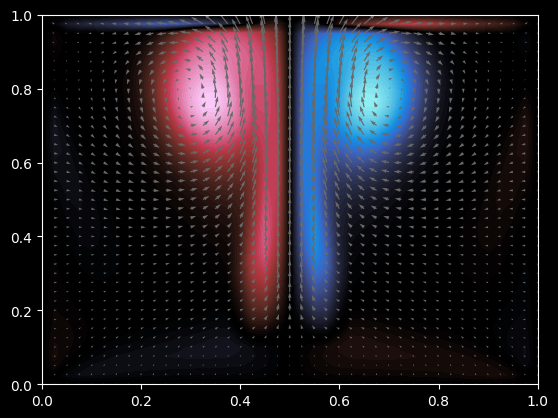

 41%|█████████████████▏                        | 41/100 [00:13<00:20,  2.95it/s]

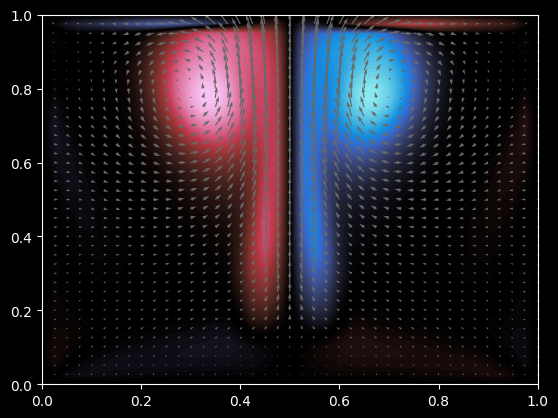

 42%|█████████████████▋                        | 42/100 [00:14<00:19,  2.98it/s]

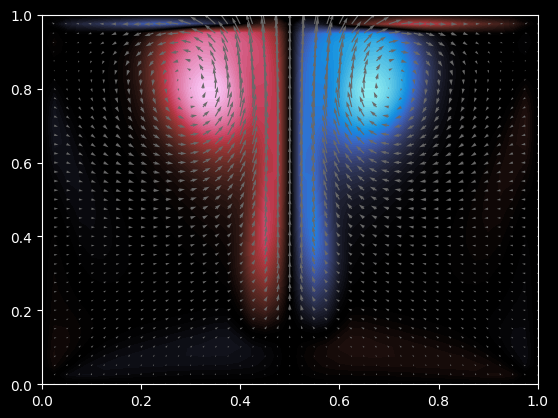

 43%|██████████████████                        | 43/100 [00:14<00:18,  3.03it/s]

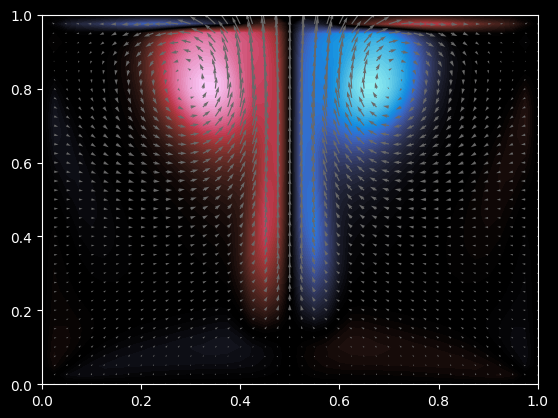

 44%|██████████████████▍                       | 44/100 [00:14<00:18,  3.06it/s]

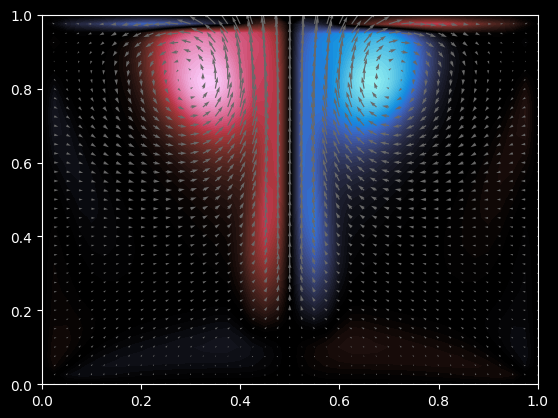

 45%|██████████████████▉                       | 45/100 [00:15<00:17,  3.06it/s]

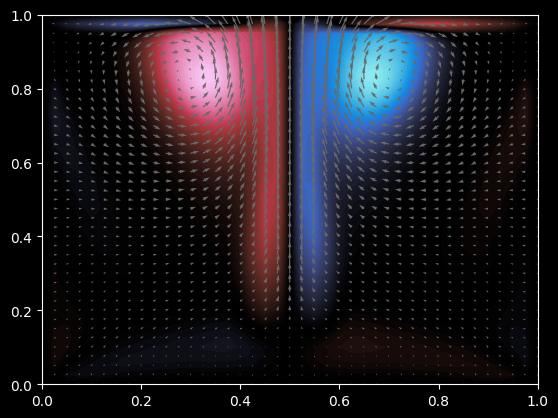

 46%|███████████████████▎                      | 46/100 [00:15<00:19,  2.75it/s]

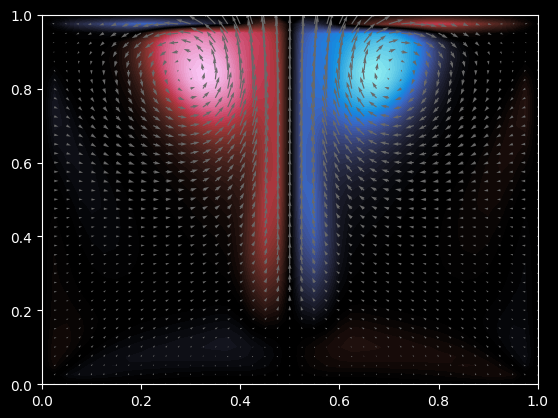

 47%|███████████████████▋                      | 47/100 [00:15<00:18,  2.86it/s]

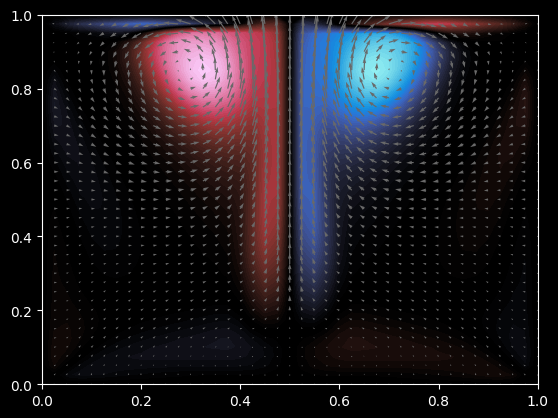

 48%|████████████████████▏                     | 48/100 [00:16<00:17,  2.93it/s]

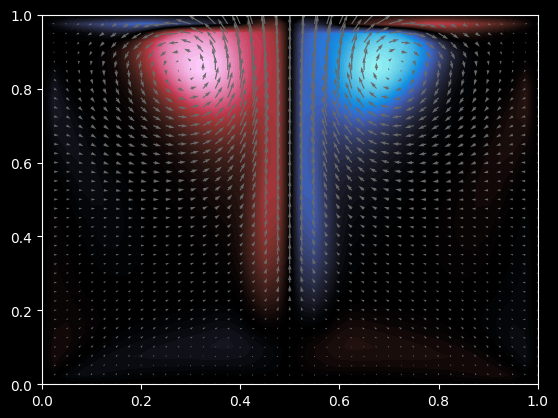

 49%|████████████████████▌                     | 49/100 [00:16<00:17,  3.00it/s]

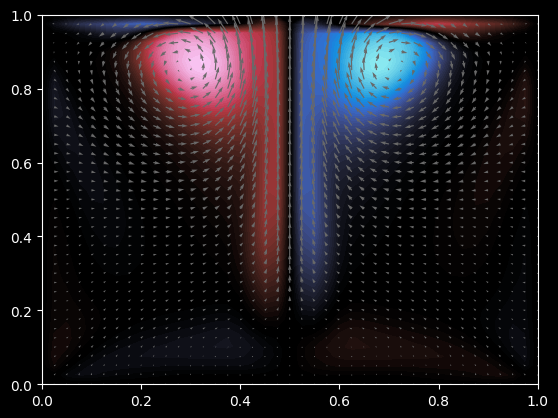

 50%|█████████████████████                     | 50/100 [00:16<00:16,  3.05it/s]

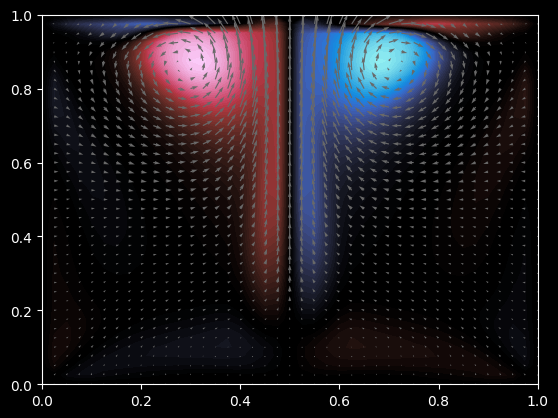

 51%|█████████████████████▍                    | 51/100 [00:17<00:17,  2.84it/s]

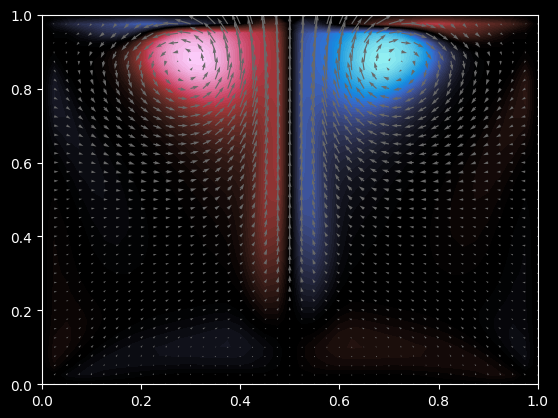

 52%|█████████████████████▊                    | 52/100 [00:17<00:18,  2.65it/s]

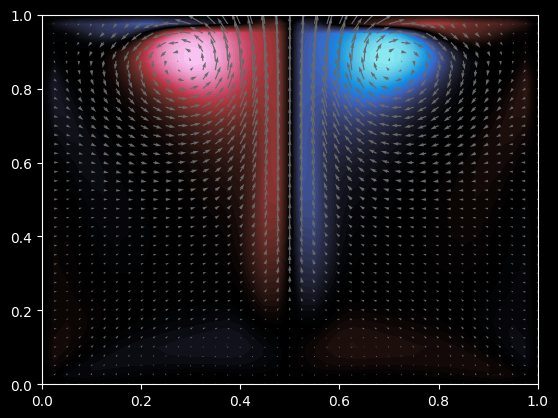

 53%|██████████████████████▎                   | 53/100 [00:18<00:16,  2.79it/s]

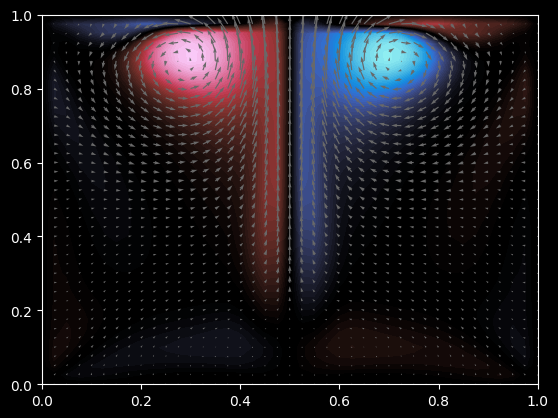

 54%|██████████████████████▋                   | 54/100 [00:18<00:15,  2.89it/s]

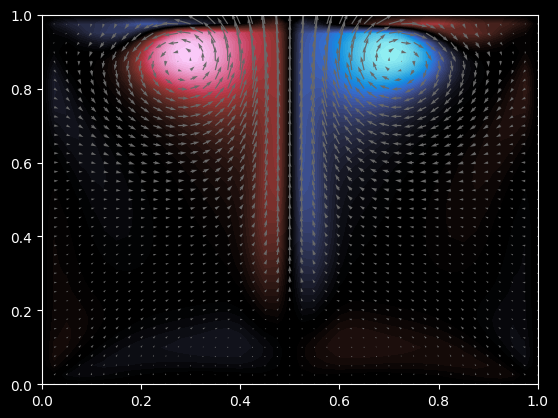

 55%|███████████████████████                   | 55/100 [00:18<00:15,  2.94it/s]

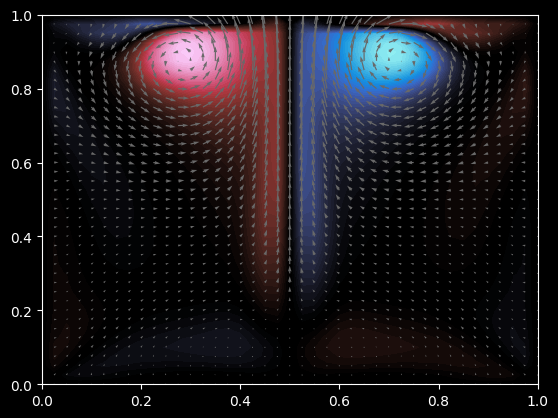

 56%|███████████████████████▌                  | 56/100 [00:18<00:14,  3.02it/s]

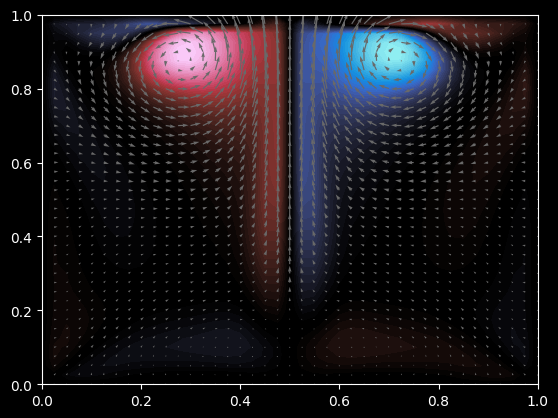

 57%|███████████████████████▉                  | 57/100 [00:19<00:15,  2.76it/s]

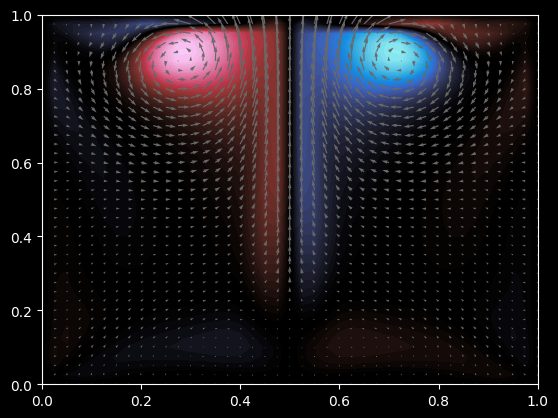

 58%|████████████████████████▎                 | 58/100 [00:19<00:14,  2.85it/s]

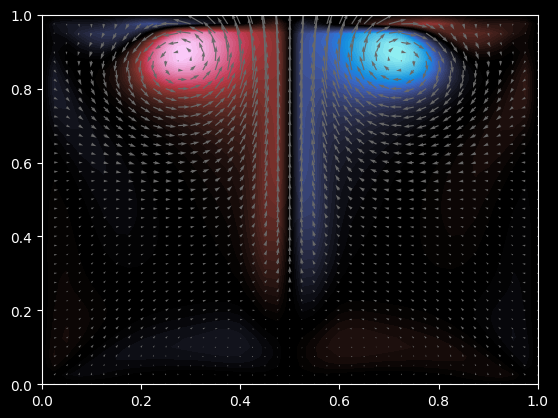

 59%|████████████████████████▊                 | 59/100 [00:20<00:14,  2.87it/s]

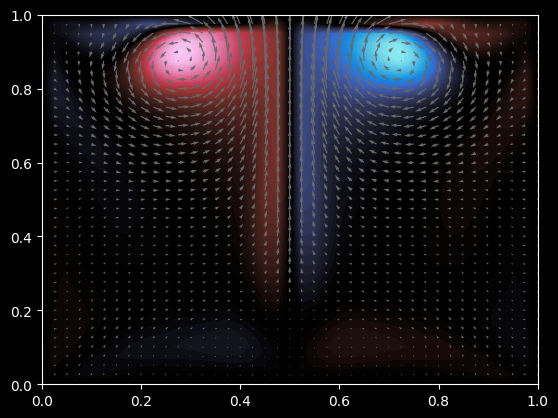

 60%|█████████████████████████▏                | 60/100 [00:20<00:13,  2.88it/s]

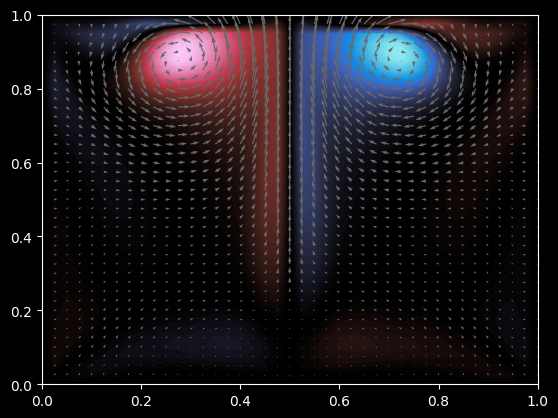

 61%|█████████████████████████▌                | 61/100 [00:20<00:13,  2.97it/s]

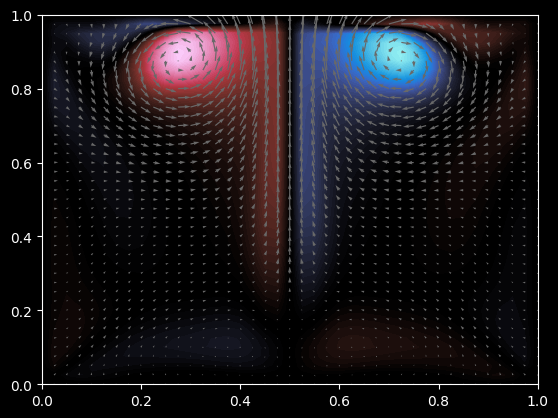

 62%|██████████████████████████                | 62/100 [00:21<00:12,  2.98it/s]

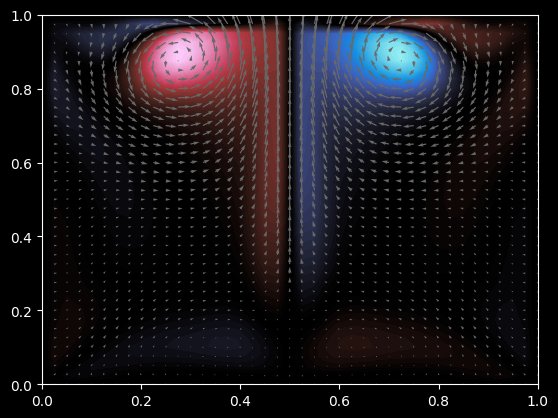

 63%|██████████████████████████▍               | 63/100 [00:21<00:12,  2.93it/s]

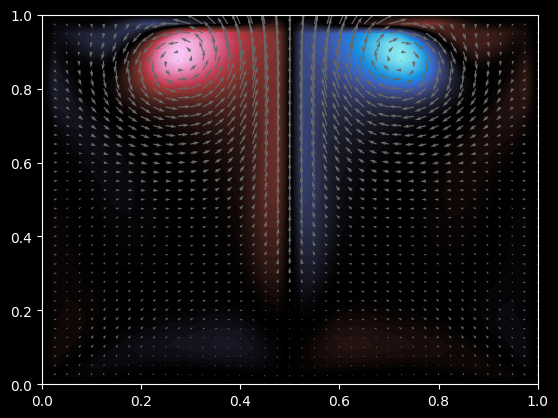

 64%|██████████████████████████▉               | 64/100 [00:21<00:12,  2.95it/s]

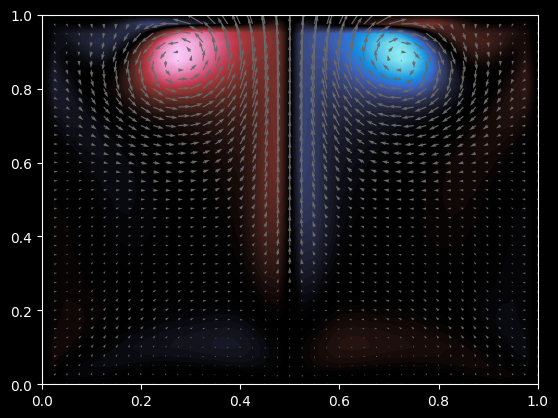

 65%|███████████████████████████▎              | 65/100 [00:22<00:11,  2.97it/s]

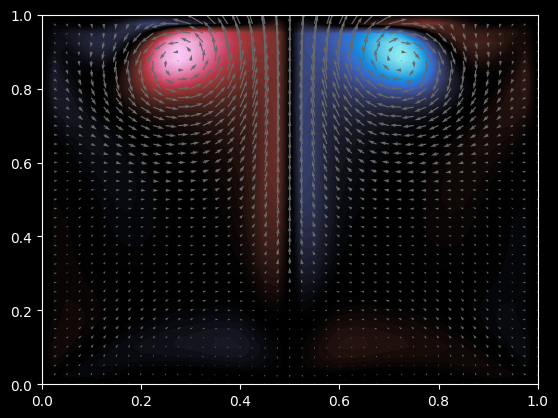

 66%|███████████████████████████▋              | 66/100 [00:22<00:11,  3.03it/s]

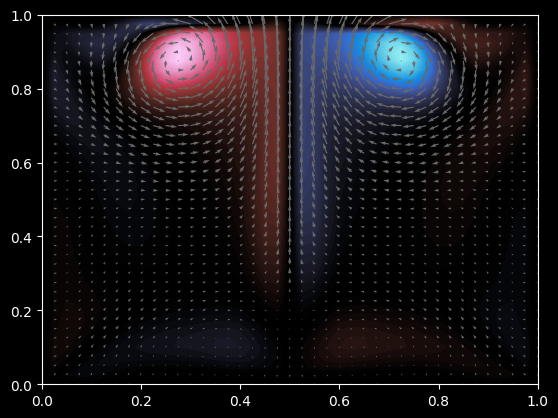

 67%|████████████████████████████▏             | 67/100 [00:22<00:10,  3.08it/s]

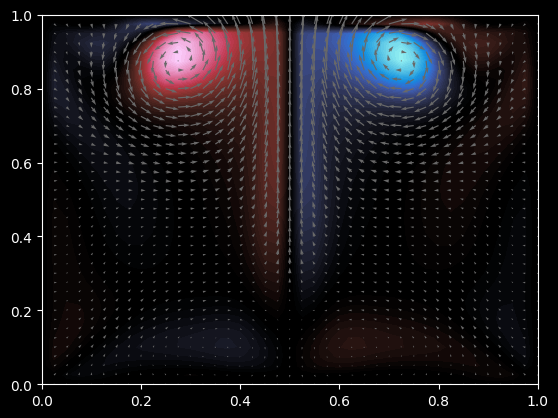

 68%|████████████████████████████▌             | 68/100 [00:23<00:11,  2.79it/s]

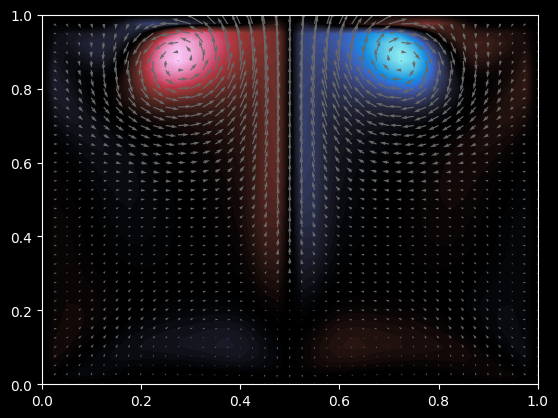

 69%|████████████████████████████▉             | 69/100 [00:23<00:10,  2.89it/s]

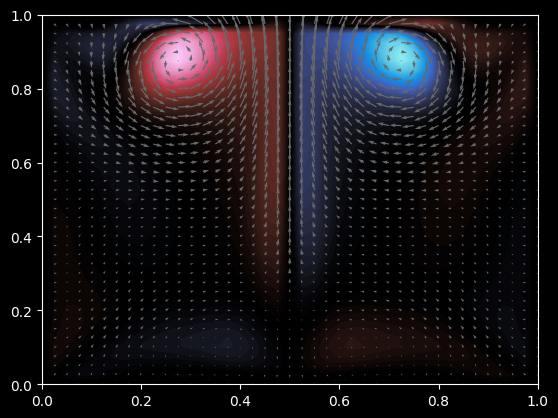

 70%|█████████████████████████████▍            | 70/100 [00:23<00:10,  2.96it/s]

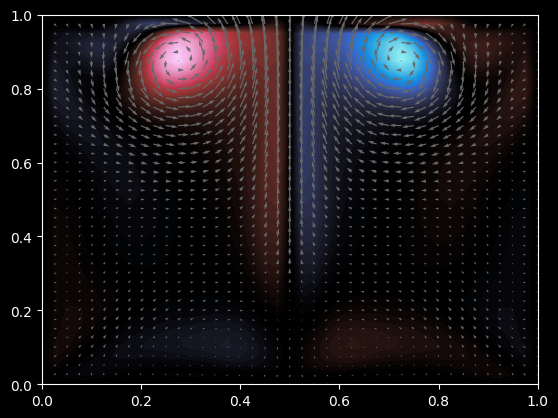

 71%|█████████████████████████████▊            | 71/100 [00:24<00:09,  3.01it/s]

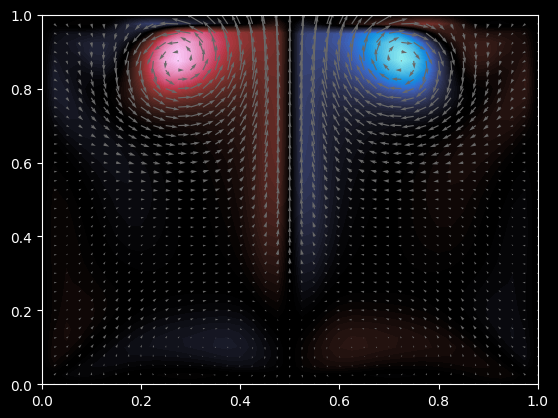

 72%|██████████████████████████████▏           | 72/100 [00:24<00:09,  3.06it/s]

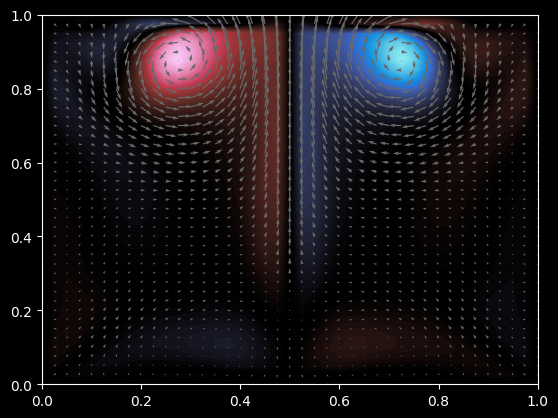

 73%|██████████████████████████████▋           | 73/100 [00:24<00:08,  3.11it/s]

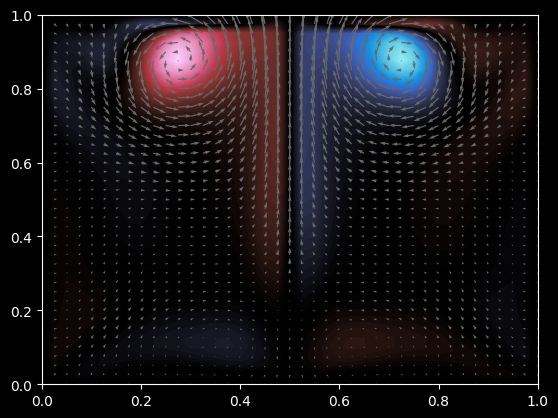

 74%|███████████████████████████████           | 74/100 [00:25<00:08,  3.13it/s]

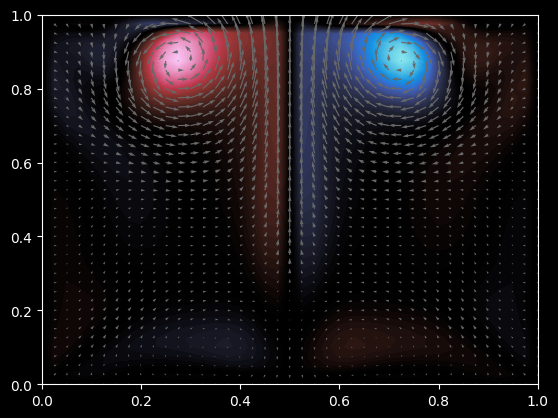

 75%|███████████████████████████████▌          | 75/100 [00:25<00:08,  2.96it/s]

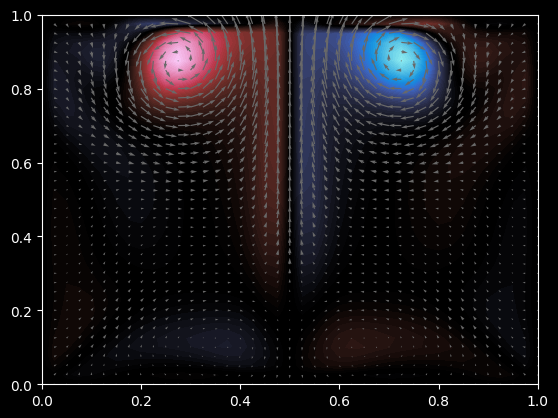

 76%|███████████████████████████████▉          | 76/100 [00:25<00:07,  3.03it/s]

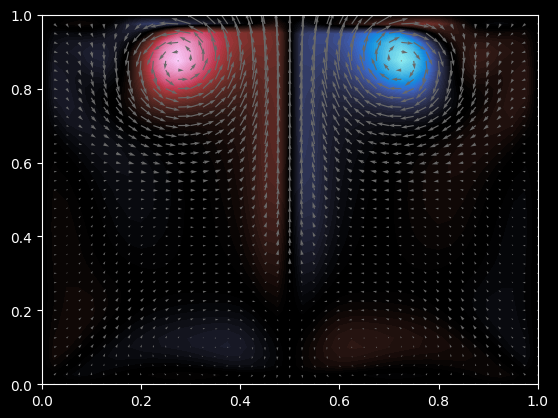

 77%|████████████████████████████████▎         | 77/100 [00:26<00:07,  3.09it/s]

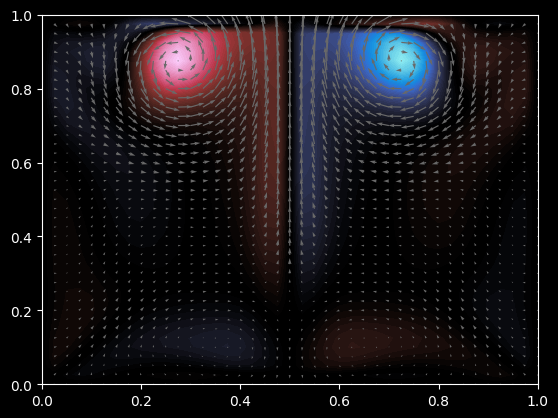

 78%|████████████████████████████████▊         | 78/100 [00:26<00:07,  3.10it/s]

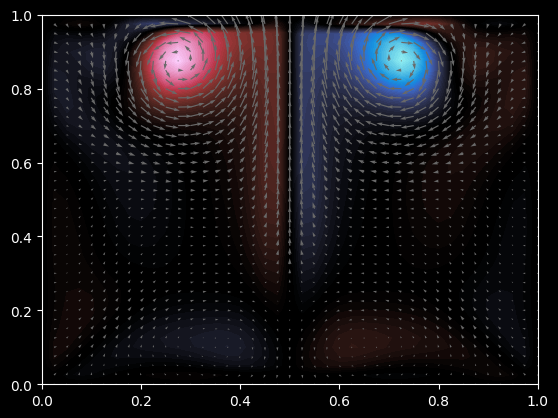

 79%|█████████████████████████████████▏        | 79/100 [00:26<00:07,  2.81it/s]

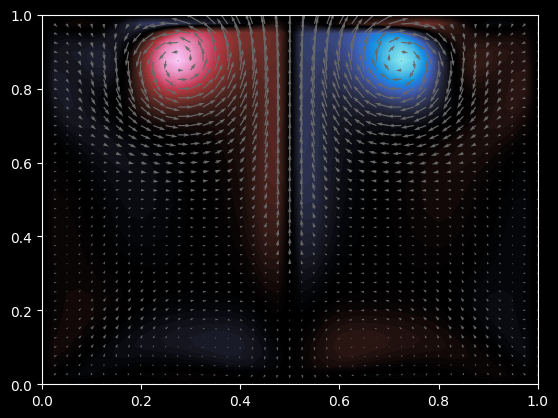

 80%|█████████████████████████████████▌        | 80/100 [00:27<00:06,  2.92it/s]

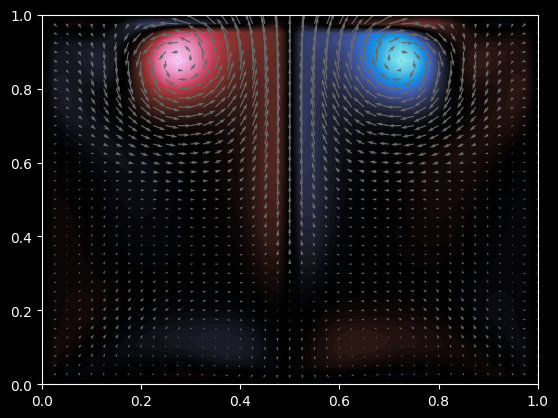

 81%|██████████████████████████████████        | 81/100 [00:27<00:06,  3.00it/s]

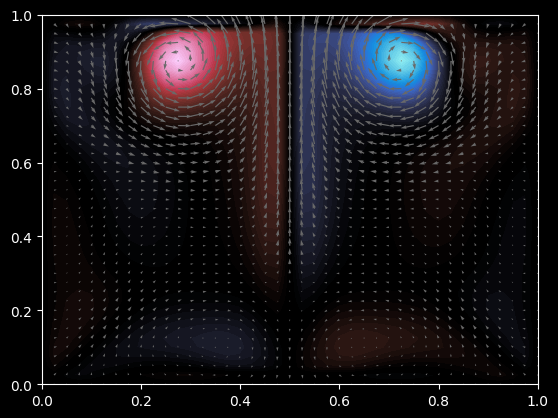

 82%|██████████████████████████████████▍       | 82/100 [00:27<00:05,  3.07it/s]

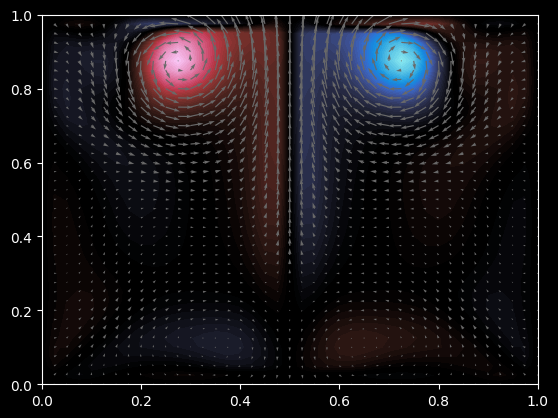

 83%|██████████████████████████████████▊       | 83/100 [00:28<00:05,  3.11it/s]

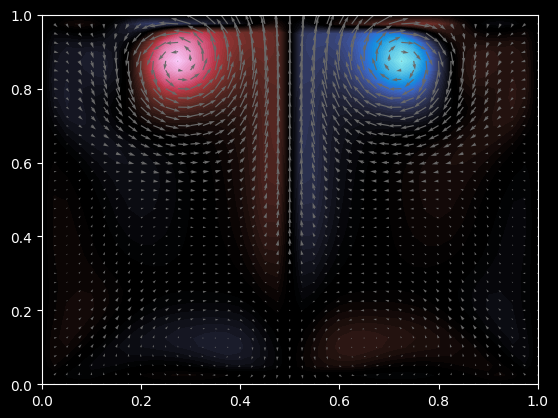

 84%|███████████████████████████████████▎      | 84/100 [00:28<00:05,  3.14it/s]

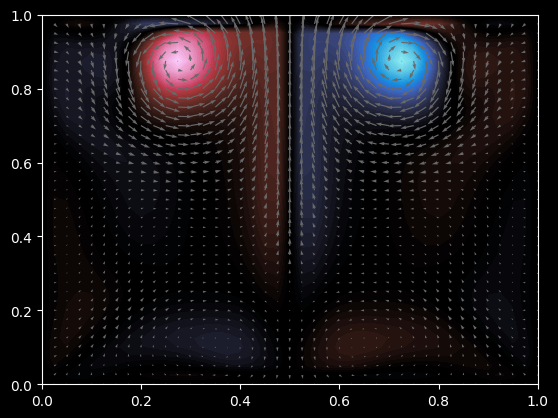

 85%|███████████████████████████████████▋      | 85/100 [00:28<00:04,  3.14it/s]

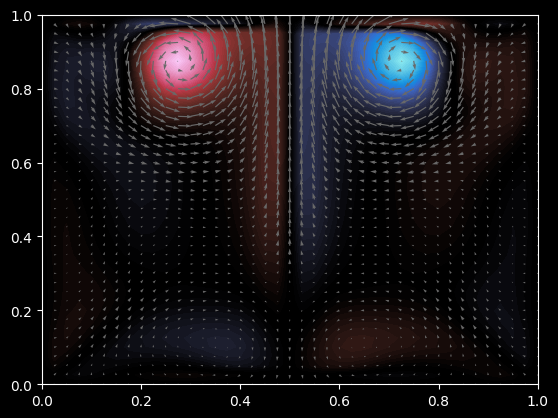

 86%|████████████████████████████████████      | 86/100 [00:28<00:04,  3.15it/s]

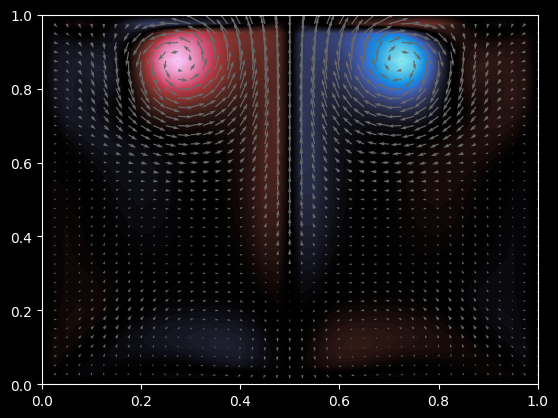

 87%|████████████████████████████████████▌     | 87/100 [00:29<00:04,  2.82it/s]

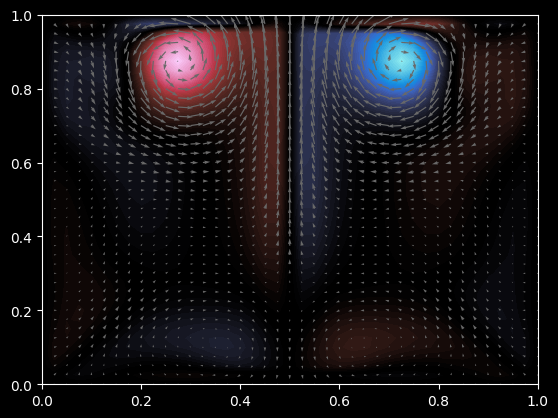

 88%|████████████████████████████████████▉     | 88/100 [00:29<00:04,  2.81it/s]

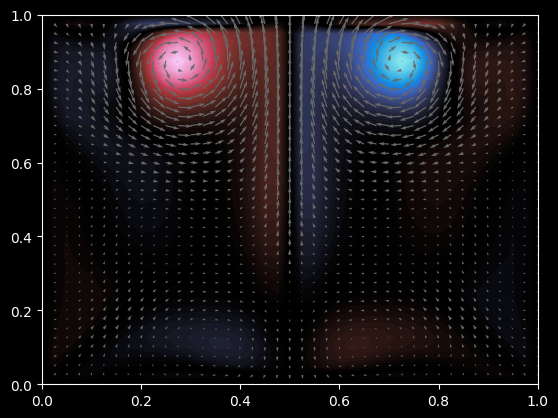

 89%|█████████████████████████████████████▍    | 89/100 [00:30<00:03,  2.82it/s]

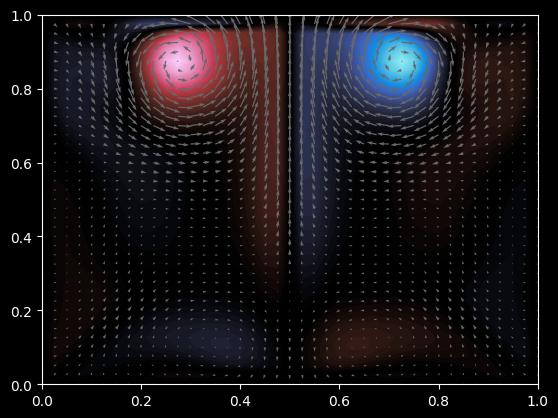

 90%|█████████████████████████████████████▊    | 90/100 [00:30<00:03,  2.54it/s]

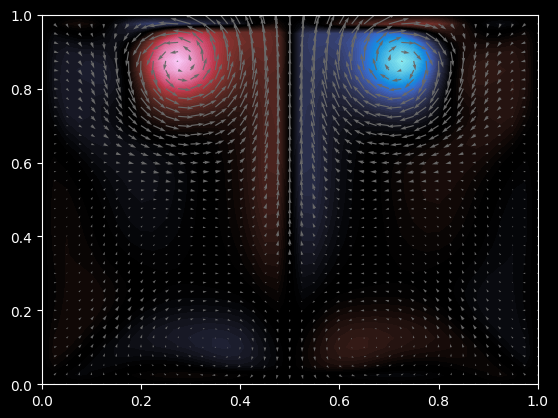

 91%|██████████████████████████████████████▏   | 91/100 [00:30<00:03,  2.62it/s]

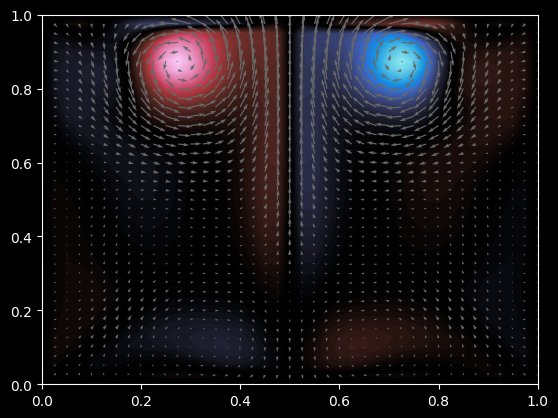

 92%|██████████████████████████████████████▋   | 92/100 [00:31<00:02,  2.74it/s]

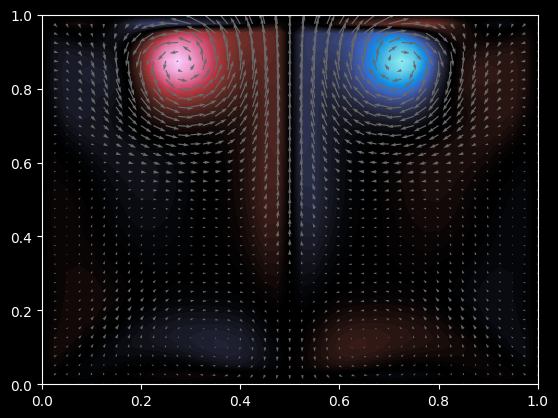

 93%|███████████████████████████████████████   | 93/100 [00:31<00:02,  2.78it/s]

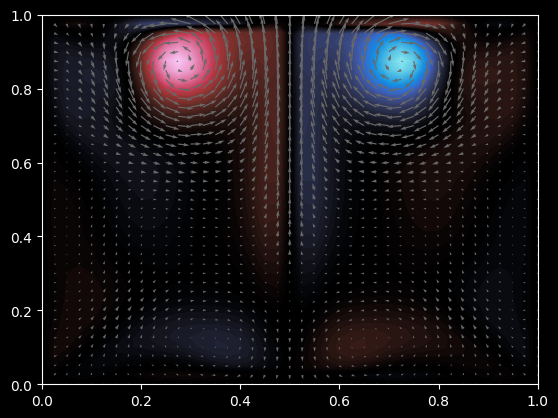

 94%|███████████████████████████████████████▍  | 94/100 [00:31<00:02,  2.84it/s]

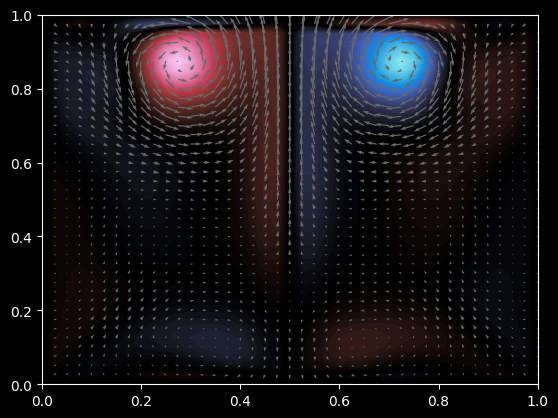

 95%|███████████████████████████████████████▉  | 95/100 [00:32<00:01,  2.92it/s]

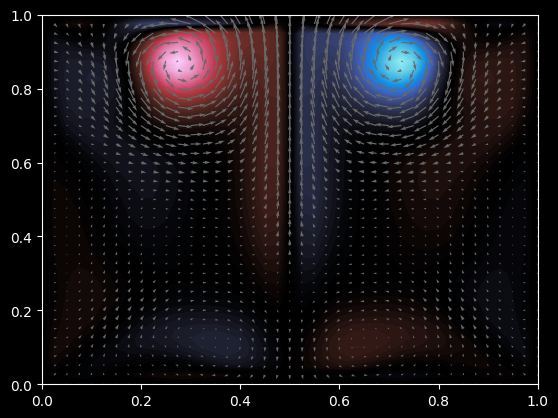

 96%|████████████████████████████████████████▎ | 96/100 [00:32<00:01,  3.00it/s]

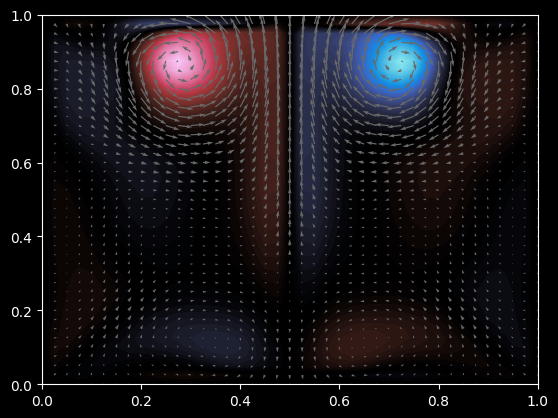

 97%|████████████████████████████████████████▋ | 97/100 [00:32<00:00,  3.07it/s]

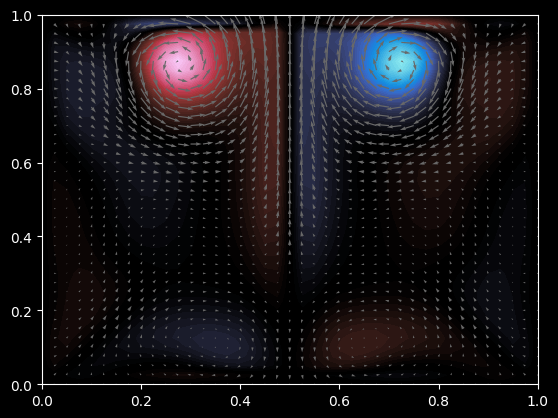

 98%|█████████████████████████████████████████▏| 98/100 [00:33<00:00,  2.93it/s]

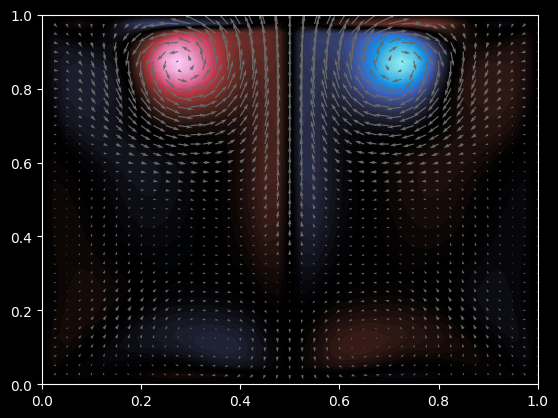

 99%|█████████████████████████████████████████▌| 99/100 [00:33<00:00,  2.99it/s]

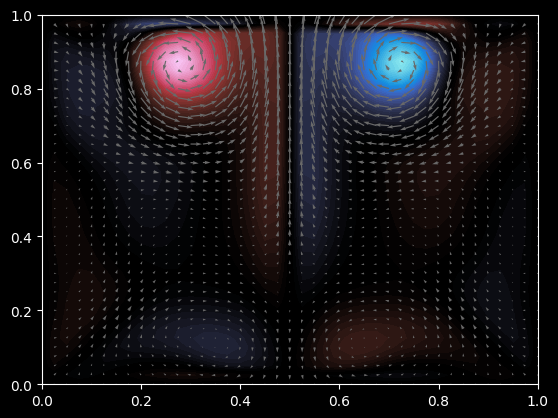

100%|█████████████████████████████████████████| 100/100 [00:33<00:00,  2.95it/s]


<Figure size 640x480 with 0 Axes>

In [44]:
"""Tryng to do fluid flow animation followed the code from:

https://medium.com/@zakariatemouch/exploring-fluid-dynamics-using-python-a-numerical-approach-with-navier-stokes-equations-0a00ddae6822

https://www.youtube.com/watch?v=wbYe58NGJJI

Basically it solves incompressible navier stokes equation, by breaking down into certain vector calc steps (you know more than me)"""


import numpy as np
import scipy.sparse.linalg as splinalg
from scipy import interpolate
import matplotlib.pyplot as plt

import cmasher as cmr
from tqdm import tqdm

DOMAIN_SIZE = 1.0
N_POINTS = 41
N_TIME_STEPS = 100
TIME_STEP_LENGTH = 0.1

KINEMATIC_VISCOSITY = 0.0001

MAX_ITER_CG = None

def forcing_function(time, point):
    time_decay = np.maximum(
        2.0 - 0.5 * time,
        0.0,
    )

    forced_value = (
        time_decay
        *
        np.where(
            (
                (point[0] > 0.4)
                &
                (point[0] < 0.6)
                &
                (point[1] > 0.1)
                &
                (point[1] < 0.3)
            ),
            np.array([0.0, 1.0]),
            np.array([0.0, 0.0]),
        )
    )

    return forced_value


def main():
    element_length = DOMAIN_SIZE / (N_POINTS - 1)
    scalar_shape = (N_POINTS, N_POINTS)
    scalar_dof = N_POINTS**2
    vector_shape = (N_POINTS, N_POINTS, 2)
    vector_dof = N_POINTS**2 * 2

    x = np.linspace(0.0, DOMAIN_SIZE, N_POINTS)
    y = np.linspace(0.0, DOMAIN_SIZE, N_POINTS)


    X, Y = np.meshgrid(x, y, indexing="ij")

    coordinates = np.concatenate(
        (
            X[..., np.newaxis],
            Y[..., np.newaxis],
        ),
        axis=-1,
    )

    forcing_function_vectorized = np.vectorize(
        pyfunc=forcing_function,
        signature="(),(d)->(d)",
    )

    def partial_derivative_x(field):
        diff = np.zeros_like(field)

        diff[1:-1, 1:-1] = (
            (
                field[2:  , 1:-1]
                -
                field[0:-2, 1:-1]
            ) / (
                2 * element_length
            )
        )

        return diff

    def partial_derivative_y(field):
        diff = np.zeros_like(field)

        diff[1:-1, 1:-1] = (
            (
                field[1:-1, 2:  ]
                -
                field[1:-1, 0:-2]
            ) / (
                2 * element_length
            )
        )

        return diff

    def laplace(field):
        diff = np.zeros_like(field)

        diff[1:-1, 1:-1] = (
            (
                field[0:-2, 1:-1]
                +
                field[1:-1, 0:-2]
                - 4 *
                field[1:-1, 1:-1]
                +
                field[2:  , 1:-1]
                +
                field[1:-1, 2:  ]
            ) / (
                element_length**2
            )
        )

        return diff
    
    def divergence(vector_field):
        divergence_applied = (
            partial_derivative_x(vector_field[..., 0])
            +
            partial_derivative_y(vector_field[..., 1])
        )

        return divergence_applied
    
    def gradient(field):
        gradient_applied = np.concatenate(
            (
                partial_derivative_x(field)[..., np.newaxis],
                partial_derivative_y(field)[..., np.newaxis],
            ),
            axis=-1,
        )

        return gradient_applied

    def curl_2d(vector_field):
        curl_applied = (
            partial_derivative_x(vector_field[..., 1])
            -
            partial_derivative_y(vector_field[..., 0])
        )

        return curl_applied



    def advect(field, vector_field):
        backtraced_positions = np.clip(
            (
                coordinates
                -
                TIME_STEP_LENGTH
                *
                vector_field
            ),
            0.0,
            DOMAIN_SIZE,
        )

        advected_field = interpolate.interpn(
            points=(x, y),
            values=field,
            xi=backtraced_positions,
        )

        return advected_field
    
    def diffusion_operator(vector_field_flattened):
        vector_field = vector_field_flattened.reshape(vector_shape)

        diffusion_applied = (
            vector_field
            -
            KINEMATIC_VISCOSITY
            *
            TIME_STEP_LENGTH
            *
            laplace(vector_field)
        )

        return diffusion_applied.flatten()
    
    def poisson_operator(field_flattened):
        field = field_flattened.reshape(scalar_shape)

        poisson_applied = laplace(field)

        return poisson_applied.flatten()

    plt.style.use("dark_background")
    plt.figure(figsize=(5, 5), dpi=160)

    velocities_prev = np.zeros(vector_shape)
    
    time_current = 0.0
    for i in tqdm(range(N_TIME_STEPS)):
        time_current += TIME_STEP_LENGTH

        forces = forcing_function_vectorized(
            time_current,
            coordinates,
        )

        # Apply Forces
        velocities_forces_applied = (
            velocities_prev
            +
            TIME_STEP_LENGTH
            *
            forces
        )

        # Nonlinear convection (=self-advection)
        velocities_advected = advect(
            field=velocities_forces_applied,
            vector_field=velocities_forces_applied,
        )

        # Diffuse
        velocities_diffused = splinalg.cg(
            A=splinalg.LinearOperator(
                shape=(vector_dof, vector_dof),
                matvec=diffusion_operator,
            ),
            b=velocities_advected.flatten(),
            maxiter=MAX_ITER_CG,
        )[0].reshape(vector_shape)

        # Compute a pressure correction
        pressure = splinalg.cg(
            A=splinalg.LinearOperator(
                shape=(scalar_dof, scalar_dof),
                matvec=poisson_operator,
            ),
            b=divergence(velocities_diffused).flatten(),
            maxiter=MAX_ITER_CG,
        )[0].reshape(scalar_shape)

        # Correct the velocities to be incompressible
        velocities_projected = (
            velocities_diffused
            -
            gradient(pressure)
        )

        # Advance to next time step
        velocities_prev = velocities_projected

        curl = curl_2d(velocities_projected)
        plt.contourf(
            X,
            Y,
            curl,
            cmap=cmr.redshift,
            levels=100,
        )
        #plot
        plt.quiver(
            X, 
            Y,
            velocities_projected[..., 0],
            velocities_projected[..., 1],
            color="dimgray",
        )
        plt.draw()
        plt.pause(0.0001)
        plt.clf()

    plt.show()
        


if __name__ == "__main__":
    main()
